<a href="https://colab.research.google.com/github/taranggpt6/Sentiment-Analysis-NLP/blob/main/Sentiment_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
pd.set_option('display.max_columns',None)
import csv
import matplotlib.pyplot as plt
import numpy as np
#sklearn
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB

In [3]:
# with open(r'C:\Users\Tamma\Desktop\PGD ML & AI\DataSets\Amazon Case Study\NLP\Roman Urdu DataSet.csv','r',encoding='utf8') as file:
#     reader = csv.reader(file)
#     for i in reader:
#         print(i)

In [4]:
data = pd.read_csv('Roman Urdu DataSet.csv',header=None,names=['Text','Sentiment','nothg'])
data.drop(columns='nothg',inplace=True)
data.head()

,Text,Sentiment
0,Sai kha ya her kisi kay bus ki bat nhi hai lak...,Positive
1,sahi bt h,Positive
2,"Kya bt hai,",Positive
3,Wah je wah,Positive
4,Are wha kaya bat hai,Positive


In [5]:
data.Sentiment.value_counts() # 1 miss-spelled Negative

Neutral     8929
Positive    6013
Negative    5286
Neative        1
Name: Sentiment, dtype: int64

In [6]:
tobe = {'Neative':'Negative'}
data.Sentiment = data.Sentiment.replace(tobe)
data.Sentiment.value_counts()

Neutral     8929
Positive    6013
Negative    5287
Name: Sentiment, dtype: int64

In [7]:
from sklearn.preprocessing import LabelEncoder

lb = LabelEncoder()
data.Sentiment = lb.fit_transform(data.Sentiment)

In [8]:
lb.classes_

array(['Negative', 'Neutral', 'Positive'], dtype=object)

In [9]:
data.head()

,Text,Sentiment
0,Sai kha ya her kisi kay bus ki bat nhi hai lak...,2
1,sahi bt h,2
2,"Kya bt hai,",2
3,Wah je wah,2
4,Are wha kaya bat hai,2


## Train - Test Split

In [10]:
X = data['Text']
y = data['Sentiment']

In [11]:
#train test split

step = int(len(data)*.8) #80%
X_train = X[:step]
y_train = y[:step]

X_test = X[step:] #20%
y_test = y[step:]

In [12]:
print(len(X_train))
print(len(y_train))
print('-'*5)
print(len(X_test))
print(len(y_test))

16183
16183
-----
4046
4046


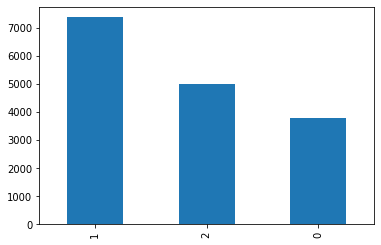

In [13]:
y_train.value_counts().plot(kind='bar') #not balanced

In [14]:
print(len(data.Text))
data.Text

20229


0        Sai kha ya her kisi kay bus ki bat nhi hai lak...
1                                                sahi bt h
2                                              Kya bt hai,
3                                               Wah je wah
4                                     Are wha kaya bat hai
                               ...                        
20224             Hamari jese awam teli laga k mazay leti 
20225    Kaash hum b parhay likhay hotayKabhi likhtay g...
20226    Bahi sayasat kufrrr ha saaaf bttttt ha qanon s...
20227                       aanti toh gussa e kr gai hain 
20228    mai b sirf shadi kanry ki waja say imran khan ...
Name: Text, Length: 20229, dtype: object

In [15]:
X_train = [str(row).lower() for row in X_train]
X_test = [str(row).lower() for row in X_test]

y_train = [tag for tag in y_train]
y_test = [tag for tag in y_test]

print('Train set shapes :',(len(X_train),len(y_train)))
print('Test set shapes :',(len(X_test),len(y_test)))
# X_train

Train set shapes : (16183, 16183)
Test set shapes : (4046, 4046)


In [16]:
def preprocess_text(kind):
    if kind == 'tfid':
        #tfid representaion
        tfid = TfidfVectorizer()
        X_train_bow = tfid.fit_transform(X_train)
        print(X_train_bow.shape)

        X_test_bow = tfid.transform(X_test)
        print(X_test_bow.shape)
        
        return(X_train_bow,X_test_bow,tfid)
        
    elif kind == 'bow':
        # Bag of words representation
        vectorizer = CountVectorizer()
        X_train_bow = vectorizer.fit_transform(X_train)
        print(X_train_bow.shape)

        X_test_bow = vectorizer.transform(X_test)
        print(X_test_bow.shape)
        
        return(X_train_bow,X_test_bow,vectorizer)
    
X_train_bow, X_test_bow, vect = preprocess_text(kind='tfid')

(16183, 28231)
(4046, 28231)


In [ ]:
pd.DataFrame(X_train_bow.toarray(),columns=vect.get_feature_names())

,00,000,000142,00923139933050,0300,03004328290,0300929358603339293586,03016958700,03045860231,03097065975,0344,04,07,08,09,0nce,0r,10,100,1000,101,102,1022,104,10405,108,109,10days,10g,10mbps,10th,11,110,115,119,11953,11tasbih,11th,12,120,1200,12000,120mm,122,124,125,12616,1286wan,129,1299,12baje,12june,13,130,1300,131,132,1325,133th,135,1350,136,137,138,139,14,140,1403750,14331,144,148,14th,15,150,1500,15000,150000,150gaz,154,15400,15525,1571,15din,15th,16,160,1600,161,162,163,164,1649,16571,1665,16th,17,170,1716,172,1728,175,17558,178,1797,17wen,18,180,1800,18000,1811,182,1821,1828,185,18500,1869,187,1872,1879,188,1880,1887,1890,1892,1895,1898,18th,19,190,1900,1901,1902,1903,1904,1905,1906,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,192,1920,1921,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,194,1940,1941,1942,1943,1944,1945,1946,1947,1948,1949,1949ke,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,1baje,1buzrg,1cc,1day,1feet,1gb,1kg,1st,20,200,2000,20000,2001,20014,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,202,202395,209,20th,21,2100,217,21month,21th,22,220,2200,221,2240,22o,23,2300,2341366,235,23rd,24,242,243,245,247,25,250,255,256,25lakh,26,265,2695,27,273,277,279,27am,27th,28,280,2800,284,286,29,299,2bje,2day,2k18,2mp,2na,2nd,2no,2ono,2ra,2ron,2sri,30,300,30000,303,30prsent,31,310,310250,31130,3194,32,3210,3220,32k,33,331runs,332158,335,338,33rd,34,34065,341,342,34726,3496336320,35,350,3500,352,35267,35390,356,358,36,362,365,36b,37,3709,374,375,38,380,3807,383,38784,39,3925,396,3afrad,3d,3g,3gb,3ino,3nhi,3rd,3re,3sre,3target,40,400,40000,400rs,40163,40404,4041,4052,41,414,41th,42,420,426,43,435,44,44700,45,45100,4520,457,46,460,47,472,4753waqiat,477,48,480,48va,49,4ron,4th,4x,50,500,5000,500mb,500rs,501,502,50wpm,51,52,53,54,54th,55,55010,56,56057500,569,57,57703,58,59,591,5match,5mp,5o,5star,5th,60,600,6000,61,62,625,625bar,629008,63,636,63rd,64,644,646,6499,65,657518,658,6595,66,6688,673,678,68,69,691,6999,6th,70,700,708,70cc,70maon,71,72,73,7306,74,745,7461,75,750,75y,76,762,77,7722017,78,799,7afrad,7th,7up,80,800,805,81,82,83,8300,836,840nd,842,85,8500,85000,865,87,88,8824,8am,8mm,8mp,8th,90,91,918,92,948,95,950,960,9600,9753,98,981,99,997,9th,_st,a1,a6a,aa,aaaa,aaaaappppp,aaaallaaaa,aaah,aaaiin,aaainda,aaalam,aaalu,aaankh,aaao,aaap,aaatma,aaaya,aaba,aabaadi,aabaai,aabad,aabai,aabao,aabbba,aabi,aabroz,aachay,aachi,aachuki,aad,aada,aadaa,aadam,aadat,aadhay,aadhi,aadi,aadmi,aadmiyon,aadmy,aae,aaeen,aaega,aaegi,aaein,aaey,aaeyn,aafaaq,aafaq,aafiat,aafiyat,aafreeni,aafrini,aaftab,aafza,aag,aaga,aagae,aagah,aagahi,aagai,aagay,aagaya,aagaye,aagayen,aagaz,aage,aaghaz,aaghosh,aagly,aagrah,aagy,aah,aahang,aahata,aahhahahaha,aahinda,aahista,aahkoon,aai,aaid,aaiga,aain,aaina,aainda,aaindah,aaini,aainni,aaisa,aaisaa,aaiyd,aaiye,aaiyn,aaiyna,aaiynda,aaiyne,aaiyni,aaj,aaja,aajata,aajati,aajaye,aajzi,aaka,aakank,aakar,aakhar,aakhir,aakhirat,aakhirkar,aakhrat,aakhri,aakrr,aal,aala,aalaa,aalaat,aalaaw,aalam,aalamgeer,aalamgir,aalayy,aalikum,aalim,aalime,aalla,aalmi,aam,aama,aamaal,aamad,aamada,aamadah,aamadgi,aamal,aamd,aamdani,aamdeed,aameeeenn,aameen,aamen,aamesizh,aamezish,aamin,aamir,aamirana,aamiriyat,aamiyana,aamla,aamm,aamriyat,aamriyaton,aan,aana,aanay,aandy,aane,aangan,aani,aankein,aankh,aankhain,aankhe,aankhein,aankhen,aankhon,aankhu,aankon,aanounce,aanso,aansoo,aansoun,aao,aaon,aaoo,aap,aapas,aapk,aapka,aapkay,aapke,aapkea,aapki,aapko,aapne,aapni,aapp,aaqa,aar,aara,aaraam,aarahi,aarai,aaram,aare,aarha,aari,aarzae,aarzi,aarzo,aarzoo,aasaan,aasakta,aasakte,aasakti,aasam,aasan,aasani,aasar,aasha,aashaat,aashi,aashiq,aashiqana,aashna,aashob,aashora,aashura,aasia,aasmam,aasman,aasodgi,aasra,aata,aatay,aate,aatee,aatey,aati,aaty,

In [ ]:
params = {'max_depth' : [5,6,7,8],
          'min_samples_leaf' : [100,200,300],
          'min_samples_split' : [200,300],
          'max_features' : [5,6,7,8],
          }

rf_model = RandomForestClassifier(n_estimators=200,
                                  n_jobs=-1,
                                  class_weight='balanced'
                                  )

grid = GridSearchCV(estimator=rf_model,
                    param_grid=params,
                    scoring='accuracy',
                    cv=3,
                    n_jobs=-1,
                    verbose=2,
                    return_train_score=True
                    )

grid.fit(X_train_bow,y_train)

Fitting 3 folds for each of 96 candidates, totalling 288 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 288 out of 288 | elapsed:  3.4min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=200, n_jobs=-1,
                                              oob_score=False,
                                              r

In [ ]:
grid.best_score_

0.4755605749199702

In [ ]:
df = pd.DataFrame(grid.cv_results_)
df.head(1)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,1.527855,0.107949,0.25003,0.009969,5,5,100,200,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.255051,0.486466,0.233407,0.324975,0.114533,80,0.247405,0.489017,0.238298,0.324906,0.116103


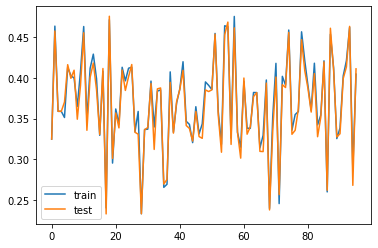

In [ ]:
plt.plot(df.index,df.mean_train_score,label='train')
plt.plot(df.index,df.mean_test_score,label='test')
plt.legend()

In [ ]:
#Random Forest is not working well, let's try Naive Bayes

In [ ]:
params = {'alpha': [0.0001,0.001,0.01,0.1,0.2,0.3,0.5]}

mnb = MultinomialNB()

grid = GridSearchCV(estimator=mnb,
                    param_grid=params,
                    scoring='accuracy',
                    cv=5,
                    return_train_score=True,
                    n_jobs=-1,
                    verbose=3)

grid.fit(X_train_bow,y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    3.2s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=MultinomialNB(alpha=1.0, class_prior=None,
                                     fit_prior=True),
             iid='deprecated', n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.5]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose=3)

In [ ]:
df = pd.DataFrame(grid.cv_results_)
df.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.043400,0.008354,0.005398,0.001496,0.0001,{'alpha': 0.0001},0.474822,0.354958,0.429719,0.521323,0.512361,0.458637,0.061095,7,0.956434,0.949405,0.949637,0.949023,0.947169,0.950334,0.003172
1,0.021999,0.002365,0.002804,0.000402,0.001,{'alpha': 0.001},0.479456,0.358048,0.431572,0.524722,0.512979,0.461355,0.060938,6,0.955894,0.948401,0.949328,0.948482,0.946474,0.949716,0.003227
2,0.023198,0.003764,0.003806,0.001942,0.01,{'alpha': 0.01},0.484090,0.365771,0.444547,0.527812,0.520396,0.468523,0.059298,5,0.952186,0.945157,0.946393,0.944543,0.941763,0.946008,0.003441
3,0.023997,0.001897,0.003602,0.000492,0.1,{'alpha': 0.1},0.501081,0.396973,0.474205,0.550062,0.535229,0.491510,0.054163,4,0.932412,0.925073,0.928395,0.921758,0.919364,0.925400,0.004646
4,0.024208,0.003240,0.003389,0.001020,0.2,{'alpha': 0.2},0.506642,0.417362,0.488724,0.560878,0.542336,0.503188,0.049896,3,0.911710,0.904990,0.909238,0.901522,0.899204,0.905333,0.004650


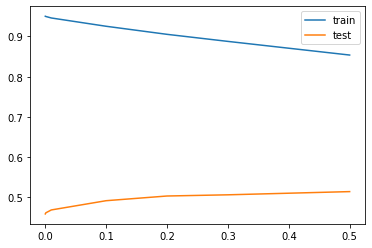

In [ ]:
plt.plot(df.param_alpha,df.mean_train_score,label='train')
plt.plot(df.param_alpha,df.mean_test_score,label='test')
plt.legend()

In [ ]:
mnb = MultinomialNB(alpha=0.1)

mnb.fit(X_train_bow,y_train)

MultinomialNB(alpha=0.1, class_prior=None, fit_prior=True)

In [ ]:
#on Train set

y_train_pred = mnb.predict(X_train_bow)

print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

           0       0.96      0.86      0.91      3777
           1       0.90      0.96      0.93      7383
           2       0.91      0.89      0.90      5023

    accuracy                           0.92     16183
   macro avg       0.92      0.90      0.91     16183
weighted avg       0.92      0.92      0.91     16183



In [ ]:
#on Train set

y_test_pred = mnb.predict(X_test_bow)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.67      0.40      0.50      1510
           1       0.50      0.75      0.60      1546
           2       0.59      0.48      0.53       990

    accuracy                           0.56      4046
   macro avg       0.58      0.55      0.54      4046
weighted avg       0.58      0.56      0.55      4046



#### Deep Learning Approach

In [17]:
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

2.3.0


In [18]:
vocab_size=100000
tokenizer = Tokenizer(num_words=vocab_size,oov_token='<OOV>')
#fitting tokenizer on train set
tokenizer.fit_on_texts(X_train)
word_index = tokenizer.word_index #word index
print(word_index)

{'<OOV>': 1, 'ke': 2, 'ki': 3, 'mein': 4, 'hai': 5, 'ka': 6, 'aur': 7, 'se': 8, 'ko': 9, 'k': 10, 'ne': 11, 'bhi': 12, 'is': 13, 'hain': 14, 'to': 15, 'ho': 16, 'kar': 17, 'e': 18, 'par': 19, 'tha': 20, 'aik': 21, 'ye': 22, 'in': 23, 'nahi': 24, 'wo': 25, 'na': 26, 'me': 27, 'or': 28, 'allah': 29, 'main': 30, 'kiya': 31, 'hi': 32, 'he': 33, 'jo': 34, 'the': 35, 'ha': 36, 'kay': 37, 'khan': 38, 'b': 39, 'pakistan': 40, 'yeh': 41, 'un': 42, 'liye': 43, 'koi': 44, 'hy': 45, 'sath': 46, 'thi': 47, 'ap': 48, 'gaya': 49, 'bad': 50, 'tak': 51, 'h': 52, 'apni': 53, 'kr': 54, 'aap': 55, 'kia': 56, 'apne': 57, 'us': 58, 'jab': 59, 'jis': 60, 'ya': 61, 'bohat': 62, 'ga': 63, 'per': 64, 'kuch': 65, 'say': 66, 'ab': 67, 'lekin': 68, 'acha': 69, 'film': 70, 'tu': 71, 'hasil': 72, 'sab': 73, 'sy': 74, 'o': 75, 'rahe': 76, 'hum': 77, 'gai': 78, 'raha': 79, 'ni': 80, 'diya': 81, 'kisi': 82, 'nhi': 83, 'baat': 84, 'hota': 85, 'iss': 86, 'nay': 87, '2': 88, 'meri': 89, 'phir': 90, 'kaam': 91, 'a': 92, 'a

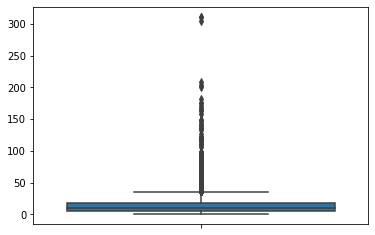

Longest Sequence in Corpus is of lenght : 311
(16183, 150)
(4046, 150)
--------------------
(16183, 3)
(16183, 3)


In [19]:
X_train_seq = tokenizer.texts_to_sequences(X_train) #transforming the text into tokenizer sequence 
X_test_seq = tokenizer.texts_to_sequences(X_test) #same for test set but with learnt on train


seq_lenghts = [len(seq) for seq in X_train_seq]

import seaborn as sb
sb.boxplot(y=seq_lenghts)
plt.show()
# plt.yscale('log')
# print(seq_lenghts)


max_lenght_seq = max([len(seq) for seq in X_train_seq]) #longest sequence on train set
print('Longest Sequence in Corpus is of lenght :',max_lenght_seq)
 #We will take max lenght of sequence as 150 as there are very less sequence with 300


#padding 
max_length = 150
X_train_padded = pad_sequences(X_train_seq,maxlen=max_length,truncating='post')
X_test_padded = pad_sequences(X_test_seq, maxlen=max_length,truncating='post')

y_train = np.array(y_train)
y_train = tf.keras.utils.to_categorical(y_train,3)

y_test = np.array(y_test)
y_test = tf.keras.utils.to_categorical(y_test,3)


print(X_train_padded.shape)
print(X_test_padded.shape)
print('-'*20)
print(y_train.shape)
print(y_train.shape)

In [38]:
class my_Callback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs['accuracy']>0.9):
            print('Condition Satisfied, Stopping Training')
            self.model.stop_training = True
            

In [25]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size,16,input_length=max_length),
    tf.keras.layers.Conv1D(128,5,activation='relu'),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(3,activation='softmax')
])

model.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.RMSprop(),
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 150, 16)           1600000   
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 146, 128)          10368     
_________________________________________________________________
global_average_pooling1d_1 ( (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 195       
Total params: 1,618,819
Trainable params: 1,618,819
Non-trainable params: 0
____________________________________________

In [27]:

history = model.fit(X_train_padded,y_train,
         epochs=20,
         validation_data=(X_test_padded,y_test)
         )


Epoch 1/20
506/506 [==============================] - 4s 9ms/step - loss: 1.0118 - accuracy: 0.5095 - val_loss: 1.0551 - val_accuracy: 0.4343
Epoch 2/20
506/506 [==============================] - 4s 8ms/step - loss: 0.9146 - accuracy: 0.5802 - val_loss: 1.0417 - val_accuracy: 0.4624
Epoch 3/20
506/506 [==============================] - 4s 8ms/step - loss: 0.8366 - accuracy: 0.6165 - val_loss: 1.0111 - val_accuracy: 0.4923
Epoch 4/20
506/506 [==============================] - 4s 8ms/step - loss: 0.7759 - accuracy: 0.6509 - val_loss: 1.0194 - val_accuracy: 0.5168
Epoch 5/20
506/506 [==============================] - 4s 8ms/step - loss: 0.7267 - accuracy: 0.6899 - val_loss: 1.0573 - val_accuracy: 0.5324
Epoch 6/20
506/506 [==============================] - 4s 8ms/step - loss: 0.6791 - accuracy: 0.7280 - val_loss: 1.0684 - val_accuracy: 0.5341
Epoch 7/20
506/506 [==============================] - 4s 8ms/step - loss: 0.6354 - accuracy: 0.7534 - val_loss: 1.0909 - val_accuracy: 0.5450
Epoch 

In [46]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size,16,input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(3,activation='softmax')
])

model.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.RMSprop(),
              metrics=['accuracy'])
model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_11 (Embedding)     (None, 150, 16)           1600000   
_________________________________________________________________
bidirectional_18 (Bidirectio (None, 150, 128)          41472     
_________________________________________________________________
bidirectional_19 (Bidirectio (None, 128)               98816     
_________________________________________________________________
dense_22 (Dense)             (None, 32)                4128      
_________________________________________________________________
dense_23 (Dense)             (None, 3)                 99        
Total params: 1,744,515
Trainable params: 1,744,515
Non-trainable params: 0
_________________________________________________________________


In [47]:
callback = my_Callback()

history = model.fit(X_train_padded,y_train,
         epochs=20,
         validation_data=(X_test_padded,y_test)
        #  callbacks=[callback]
         )


Epoch 1/20
506/506 [==============================] - 17s 35ms/step - loss: 0.9686 - accuracy: 0.5329 - val_loss: 1.0060 - val_accuracy: 0.5210
Epoch 2/20
506/506 [==============================] - 17s 33ms/step - loss: 0.7744 - accuracy: 0.6714 - val_loss: 0.9536 - val_accuracy: 0.5687
Epoch 3/20
506/506 [==============================] - 17s 33ms/step - loss: 0.6355 - accuracy: 0.7482 - val_loss: 0.9391 - val_accuracy: 0.6001
Epoch 4/20
506/506 [==============================] - 16s 32ms/step - loss: 0.5439 - accuracy: 0.7928 - val_loss: 1.0183 - val_accuracy: 0.5966
Epoch 5/20
506/506 [==============================] - 16s 32ms/step - loss: 0.4776 - accuracy: 0.8204 - val_loss: 0.9215 - val_accuracy: 0.6092
Epoch 6/20
506/506 [==============================] - 16s 32ms/step - loss: 0.4229 - accuracy: 0.8452 - val_loss: 1.0069 - val_accuracy: 0.5991
Epoch 7/20
506/506 [==============================] - 16s 32ms/step - loss: 0.3737 - accuracy: 0.8660 - val_loss: 1.0883 - val_accuracy:

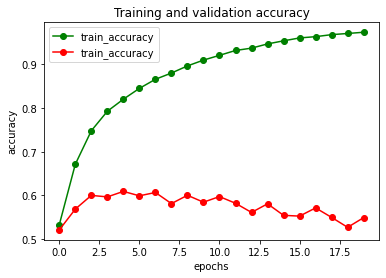

In [49]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epoch = range(len(train_acc))

plt.plot(epoch,train_acc,'go-',label='train_accuracy')
plt.plot(epoch,val_acc,'ro-',label='train_accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.show()